In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.dates import DateFormatter
import scipy.stats as stats

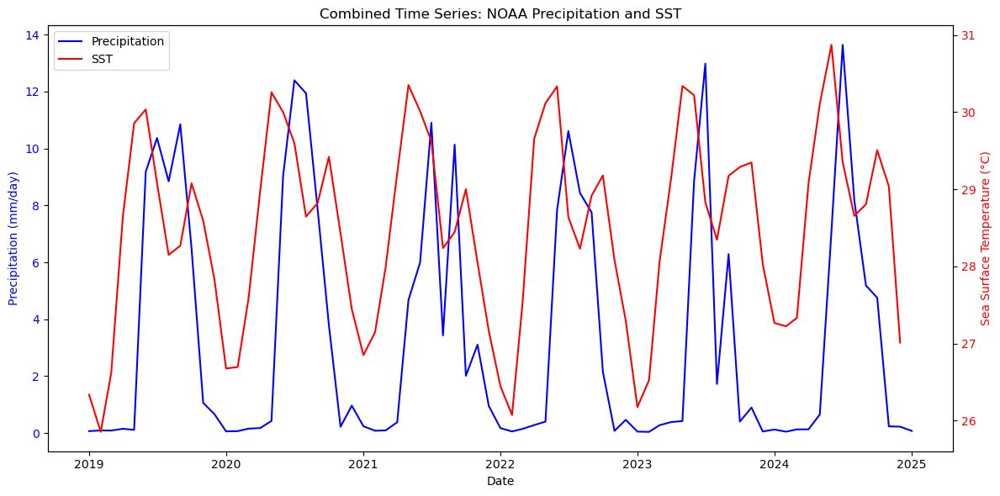

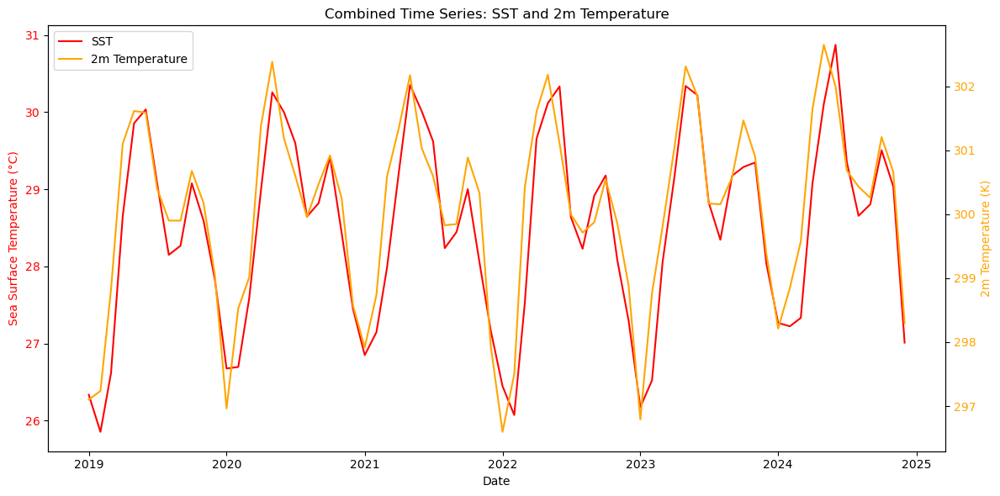

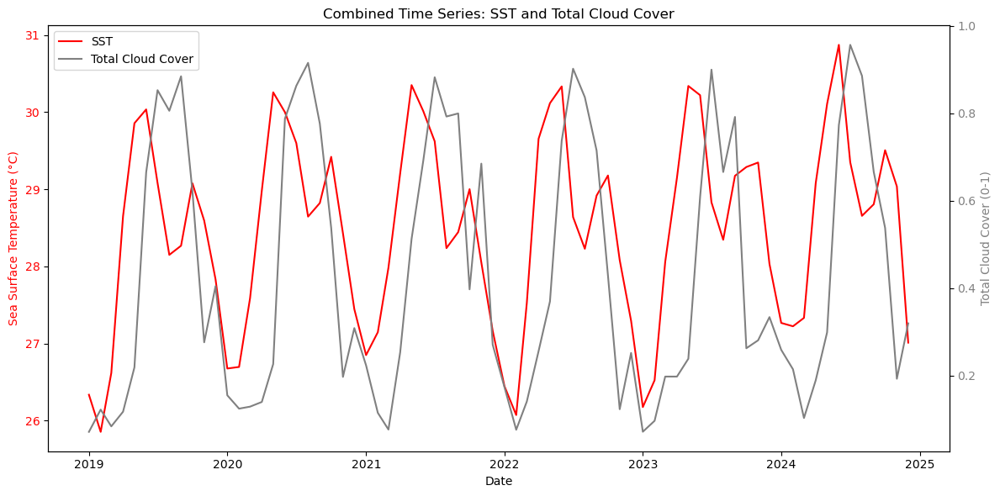

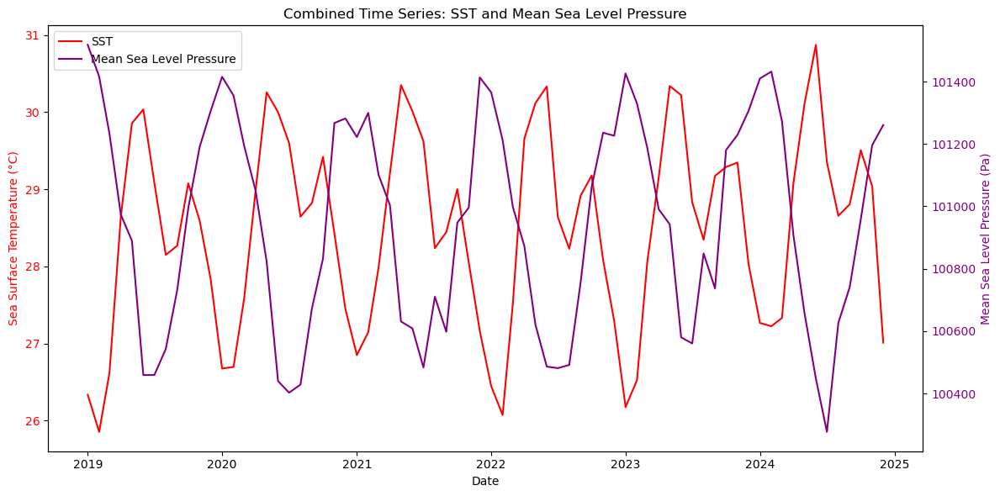

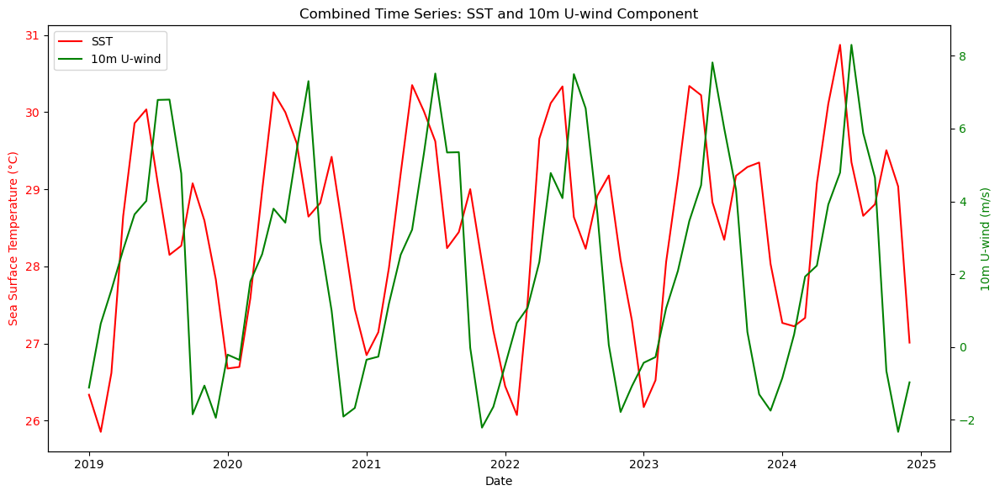

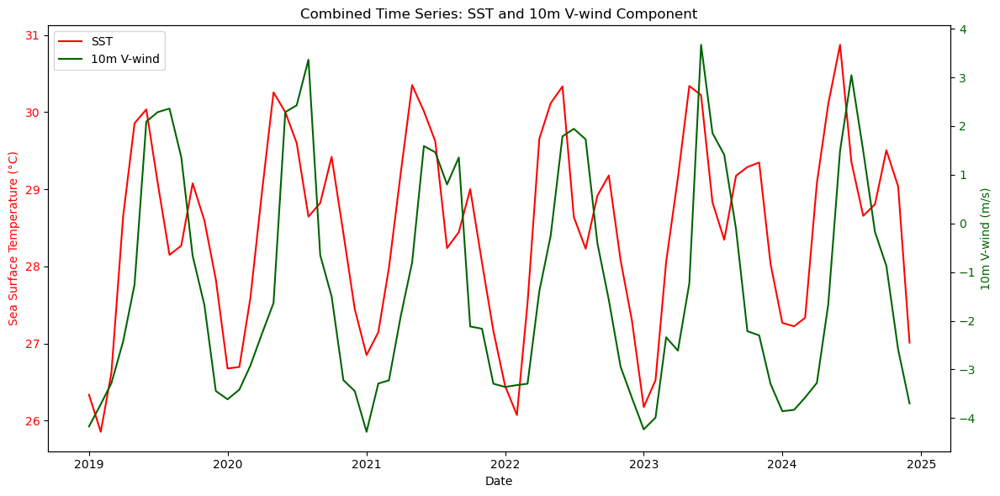

In [2]:
# Load datasets
noaa_precip = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\precip_konkan.nc")
noaa_sst = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
ecmwf = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")


# Calculate spatial means for each dataset
precip_mean = noaa_precip.precip.mean(dim=['lat', 'lon'])
sst_mean = noaa_sst.sst.mean(dim=['lat', 'lon'])
msl_mean = ecmwf.msl.mean(dim=['latitude', 'longitude'])
tcc_mean = ecmwf.tcc.mean(dim=['latitude', 'longitude'])
t2m_mean = ecmwf.t2m.mean(dim=['latitude', 'longitude'])
u10_mean = ecmwf.u10.mean(dim=['latitude', 'longitude'])
v10_mean = ecmwf.v10.mean(dim=['latitude', 'longitude'])

# Function to create combined time series plots
def plot_combined_series(var1, var1_name, var1_time, var2, var2_name, var2_time,
                         color1='blue', color2='red', title=None,
                         ylabel1=None, ylabel2=None, filename=None):
   
    fig, ax1 = plt.figure(figsize=(12, 6)), plt.gca()
   
    # First variable
    p1 = ax1.plot(var1_time, var1, color=color1, label=var1_name)
    ax1.set_xlabel('Date')
    if ylabel1:
        ax1.set_ylabel(ylabel1, color=color1)
    ax1.tick_params(axis='y', labelcolor=color1)
   
    # Second variable on twin axis
    ax2 = ax1.twinx()
    p2 = ax2.plot(var2_time, var2, color=color2, label=var2_name)
    if ylabel2:
        ax2.set_ylabel(ylabel2, color=color2)
    ax2.tick_params(axis='y', labelcolor=color2)
   
    # Add both lines to legend
    lines = p1 + p2
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper left')
   
    if title:
        plt.title(title)
   
    plt.tight_layout()
   
    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight')
   
    plt.show()

# 1. Precipitation and SST
plot_combined_series(
    precip_mean.values, 'Precipitation', pd.to_datetime(noaa_precip.time.values),
    sst_mean.values, 'SST', pd.to_datetime(noaa_sst.time.values),
    color1='blue', color2='red',
    title='Combined Time Series: NOAA Precipitation and SST',
    ylabel1='Precipitation (mm/day)', ylabel2='Sea Surface Temperature (°C)',
    filename='precip_sst_timeseries.png'
)

# 2. SST and t2m
plot_combined_series(
    sst_mean.values, 'SST', pd.to_datetime(noaa_sst.time.values),
    t2m_mean.values, '2m Temperature', pd.to_datetime(ecmwf.valid_time.values),
    color1='red', color2='orange',
    title='Combined Time Series: SST and 2m Temperature',
    ylabel1='Sea Surface Temperature (°C)', ylabel2='2m Temperature (K)',
    filename='sst_t2m_timeseries.png'
)

# 3. SST and TCC (Total Cloud Cover)
plot_combined_series(
    sst_mean.values, 'SST', pd.to_datetime(noaa_sst.time.values),
    tcc_mean.values, 'Total Cloud Cover', pd.to_datetime(ecmwf.valid_time.values),
    color1='red', color2='gray',
    title='Combined Time Series: SST and Total Cloud Cover',
    ylabel1='Sea Surface Temperature (°C)', ylabel2='Total Cloud Cover (0-1)',
    filename='sst_tcc_timeseries.png'
)

# 4. SST and MSL (Mean Sea Level Pressure)
plot_combined_series(
    sst_mean.values, 'SST', pd.to_datetime(noaa_sst.time.values),
    msl_mean.values, 'Mean Sea Level Pressure', pd.to_datetime(ecmwf.valid_time.values),
    color1='red', color2='purple',
    title='Combined Time Series: SST and Mean Sea Level Pressure',
    ylabel1='Sea Surface Temperature (°C)', ylabel2='Mean Sea Level Pressure (Pa)',
    filename='sst_msl_timeseries.png'
)

# 5. SST and TCC (duplicate, skipping as it's identical to #3)

# 6. SST and U10 (10m U-wind component)
plot_combined_series(
    sst_mean.values, 'SST', pd.to_datetime(noaa_sst.time.values),
    u10_mean.values, '10m U-wind', pd.to_datetime(ecmwf.valid_time.values),
    color1='red', color2='green',
    title='Combined Time Series: SST and 10m U-wind Component',
    ylabel1='Sea Surface Temperature (°C)', ylabel2='10m U-wind (m/s)',
    filename='sst_u10_timeseries.png'
)

# 7. SST and V10 (10m V-wind component)
plot_combined_series(
    sst_mean.values, 'SST', pd.to_datetime(noaa_sst.time.values),
    v10_mean.values, '10m V-wind', pd.to_datetime(ecmwf.valid_time.values),
    color1='red', color2='darkgreen',
    title='Combined Time Series: SST and 10m V-wind Component',
    ylabel1='Sea Surface Temperature (°C)', ylabel2='10m V-wind (m/s)',
    filename='sst_v10_timeseries.png'
)

# CORR- combined analysis

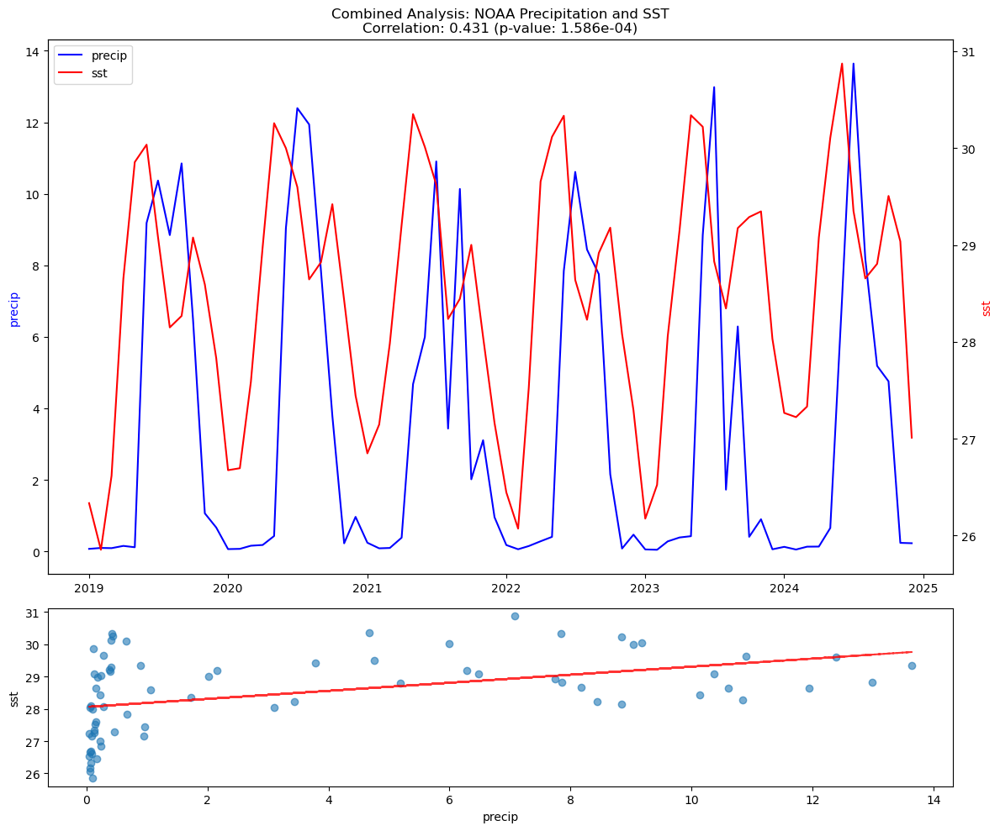

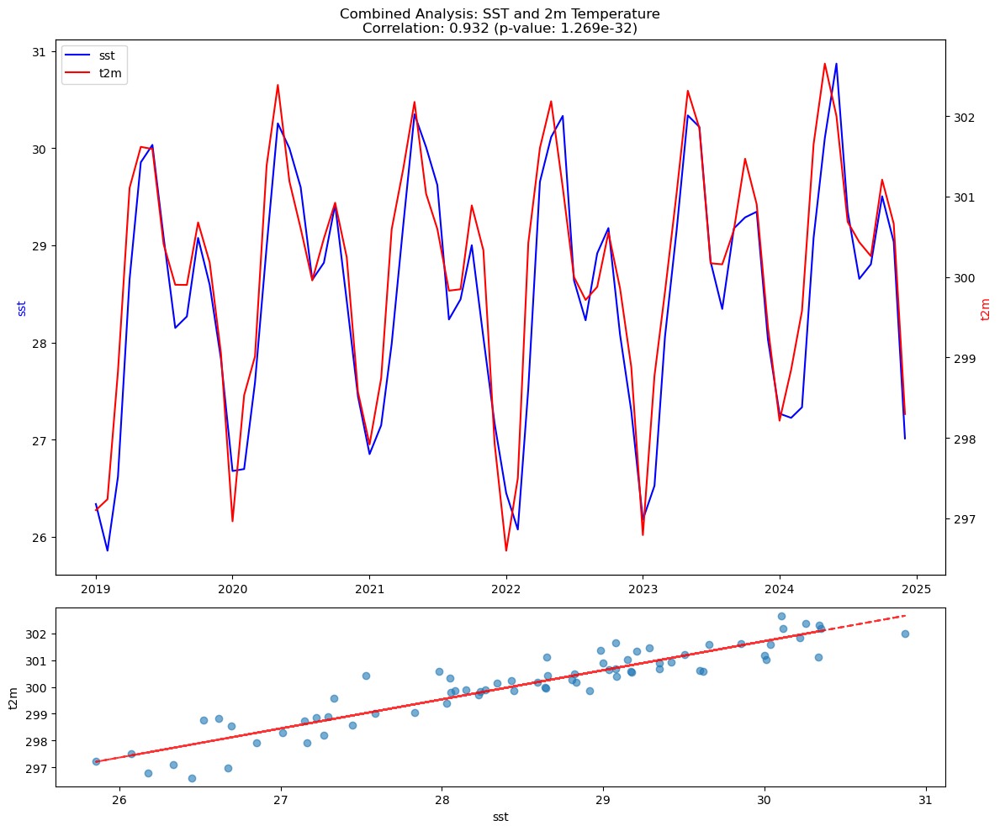

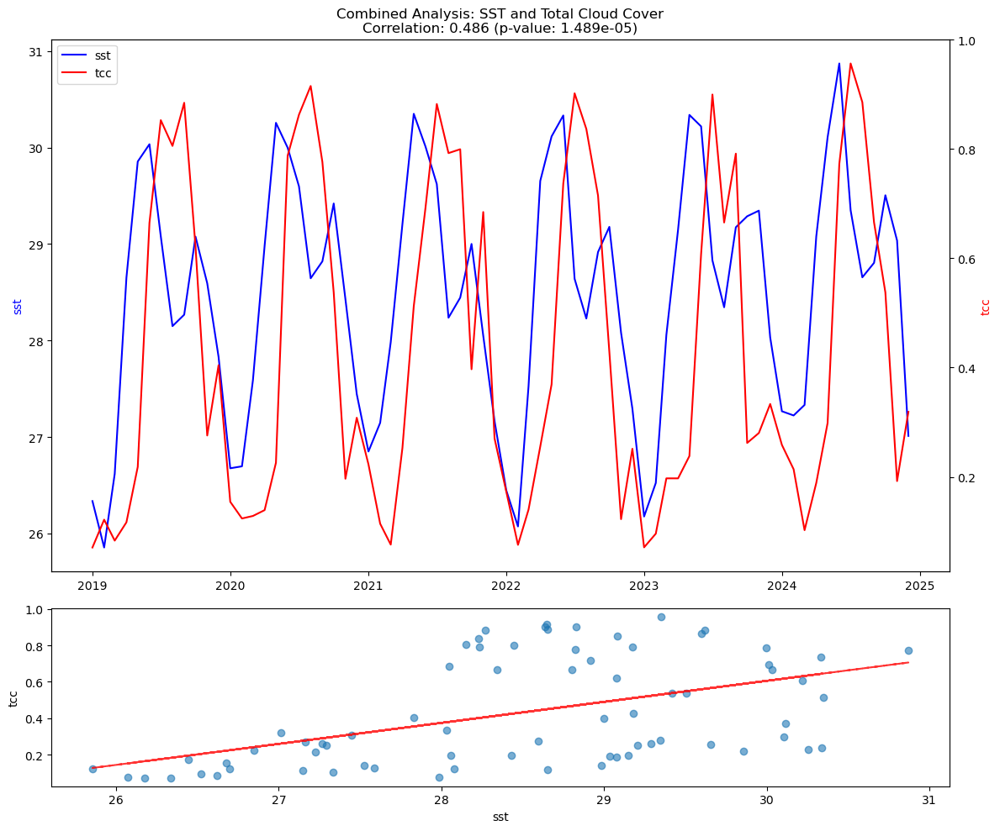

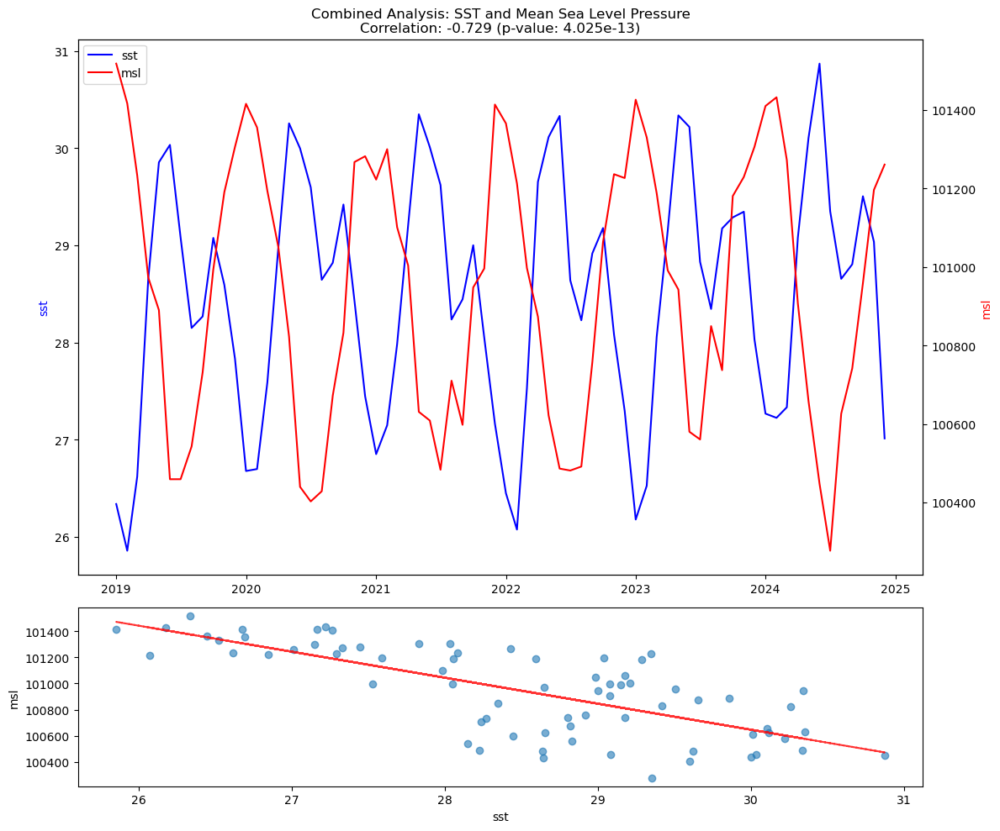

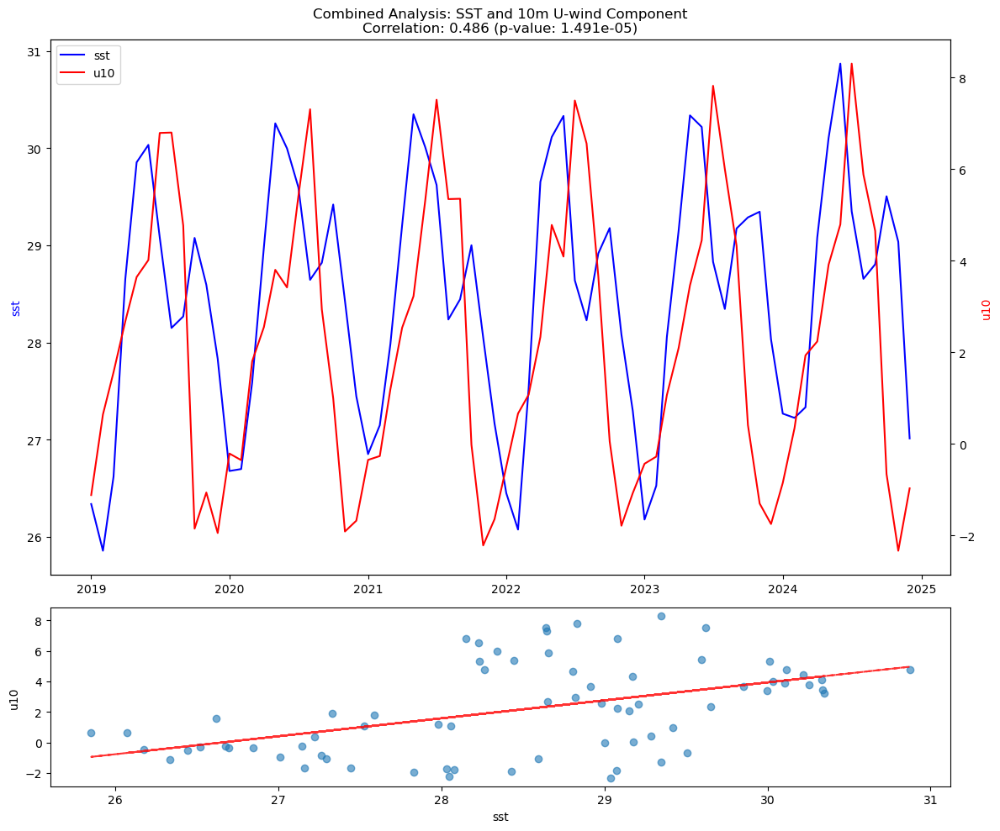

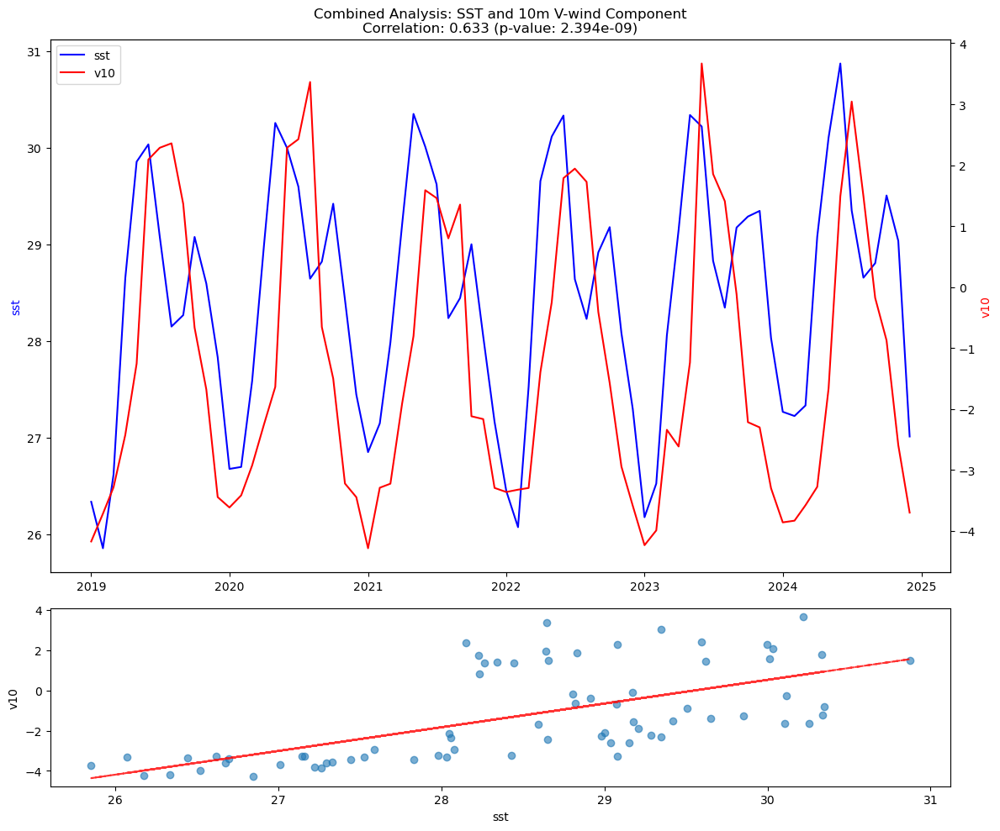

In [5]:
noaa_precip = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\precip_konkan.nc")
noaa_sst = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
ecmwf = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")

# Calculate spatial means for each dataset
precip_mean = noaa_precip.precip.mean(dim=['lat', 'lon'])
sst_mean = noaa_sst.sst.mean(dim=['lat', 'lon'])
ecmwf_means = {
    'msl': ecmwf.msl.mean(dim=['latitude', 'longitude']),
    'tcc': ecmwf.tcc.mean(dim=['latitude', 'longitude']),
    't2m': ecmwf.t2m.mean(dim=['latitude', 'longitude']),
    'u10': ecmwf.u10.mean(dim=['latitude', 'longitude']),
    'v10': ecmwf.v10.mean(dim=['latitude', 'longitude'])
}

# Create time series DataFrames
noaa_precip_df = pd.DataFrame({
    'time': pd.to_datetime(noaa_precip.time.values),
    'precip': precip_mean.values
}).set_index('time')

noaa_sst_df = pd.DataFrame({
    'time': pd.to_datetime(noaa_sst.time.values),
    'sst': sst_mean.values
}).set_index('time')

ecmwf_df = pd.DataFrame({
    'time': pd.to_datetime(ecmwf.valid_time.values),
    'msl': ecmwf_means['msl'].values,
    'tcc': ecmwf_means['tcc'].values,
    't2m': ecmwf_means['t2m'].values,
    'u10': ecmwf_means['u10'].values,
    'v10': ecmwf_means['v10'].values
}).set_index('time')

# Function to plot time series with correlation
def plot_correlated_series(df1, var1, df2, var2, title=None, filename=None):
    # Match the time indices
    common_df = pd.merge(
        df1[[var1]], df2[[var2]],
        left_index=True, right_index=True,
        how='inner'
    )
   
    # Calculate correlation
    correlation, p_value = stats.pearsonr(common_df[var1], common_df[var2])
   
    # Plot
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), gridspec_kw={'height_ratios': [3, 1]})
   
    # Time series plot
    ax1.plot(common_df.index, common_df[var1], 'b-', label=var1)
    ax1_twin = ax1.twinx()
    ax1_twin.plot(common_df.index, common_df[var2], 'r-', label=var2)
   
    # Add legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax1_twin.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')
   
    ax1.set_ylabel(var1, color='blue')
    ax1_twin.set_ylabel(var2, color='red')
   
    if title:
        ax1.set_title(f"{title}\nCorrelation: {correlation:.3f} (p-value: {p_value:.3e})")
    else:
        ax1.set_title(f"Correlation: {correlation:.3f} (p-value: {p_value:.3e})")
   
    # Scatter plot
    ax2.scatter(common_df[var1], common_df[var2], alpha=0.6)
    ax2.set_xlabel(var1)
    ax2.set_ylabel(var2)
   
    # Add trend line
    z = np.polyfit(common_df[var1], common_df[var2], 1)
    p = np.poly1d(z)
    ax2.plot(common_df[var1], p(common_df[var1]), "r--", alpha=0.8)
   
    plt.tight_layout()
   
    plt.show()

# Plot all requested combinations
# 1. Precipitation and SST
plot_correlated_series(
    noaa_precip_df, 'precip',
    noaa_sst_df, 'sst',
    title='Combined Analysis: NOAA Precipitation and SST',
    filename='precip_sst_analysis.png'
)

# 2. SST and t2m
plot_correlated_series(
    noaa_sst_df, 'sst',
    ecmwf_df, 't2m',
    title='Combined Analysis: SST and 2m Temperature',
    filename='sst_t2m_analysis.png'
)

# 3. SST and tcc
plot_correlated_series(
    noaa_sst_df, 'sst',
    ecmwf_df, 'tcc',
    title='Combined Analysis: SST and Total Cloud Cover',
    filename='sst_tcc_analysis.png'
)

# 4. SST and msl
plot_correlated_series(
    noaa_sst_df, 'sst',
    ecmwf_df, 'msl',
    title='Combined Analysis: SST and Mean Sea Level Pressure',
    filename='sst_msl_analysis.png'
)

# 5. SST and u10
plot_correlated_series(
    noaa_sst_df, 'sst',
    ecmwf_df, 'u10',
    title='Combined Analysis: SST and 10m U-wind Component',
    filename='sst_u10_analysis.png'
)

# 6. SST and v10
plot_correlated_series(
    noaa_sst_df, 'sst',
    ecmwf_df, 'v10',
    title='Combined Analysis: SST and 10m V-wind Component',
    filename='sst_v10_analysis.png'
)

# Spatial Correlation Heatmap

1 . SST - PRECIP

In [1]:
# Load datasets
sst_data = xr.open_dataset(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
precip_data = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\precip_konkan.nc")

# Ensure same time period
common_times = np.intersect1d(sst_data.time, precip_data.time)
sst = sst_data.sst.sel(time=common_times)
precip = precip_data.precip.sel(time=common_times)

# Interpolate to common grid if needed
# If datasets have different grids, uncomment and modify:
# precip = precip.interp(lat=sst.lat, lon=sst.lon)

# Compute correlation at each grid point
correlation = xr.corr(sst, precip, dim='time')

# Plot
plt.figure(figsize=(10, 8))
ax = plt.axes(projection=None)
im = correlation.plot(ax=ax, cmap='RdBu_r', vmin=-1, vmax=1)
plt.colorbar(im, label='Correlation Coefficient')
plt.title('Spatial Correlation: SST vs Precipitation')
plt.tight_layout()
#plt.savefig('sst_precip_correlation.png', dpi=300)
plt.show()

NameError: name 'xr' is not defined

2 SST- T2M

C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. 

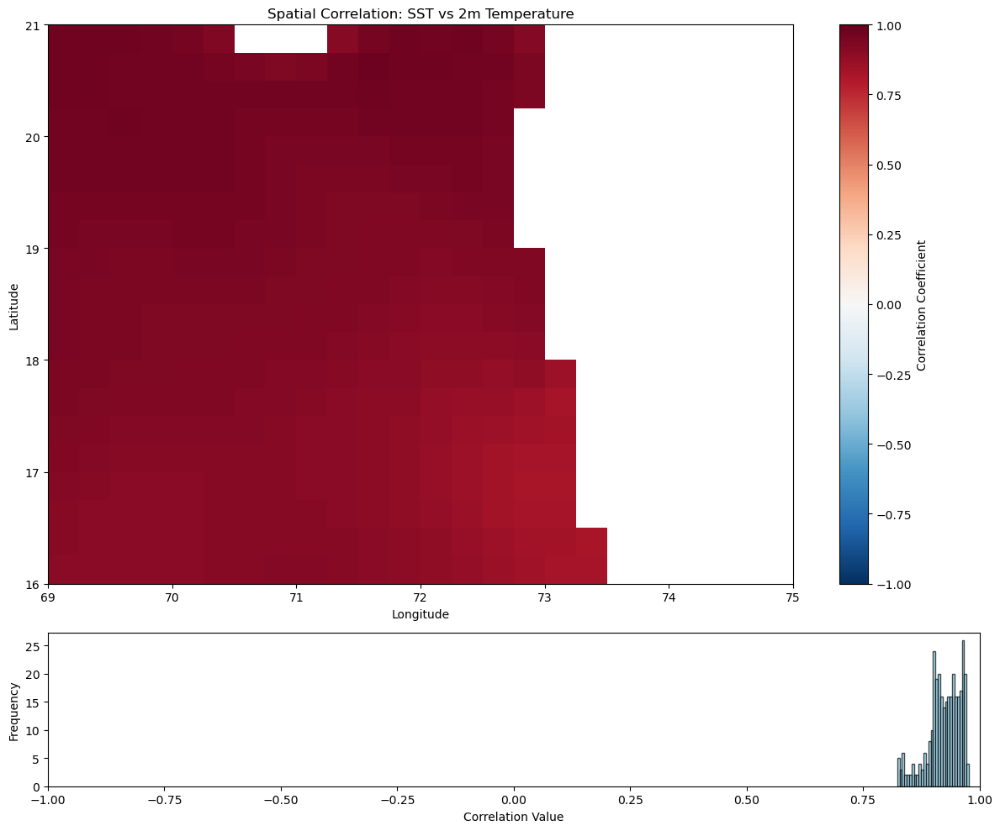

In [4]:
# Load datasets
sst_data = xr.open_dataset(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
ecmwf_data = xr.open_dataset(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")

# Ensure same time period
sst = sst_data.sst.sel(time=slice('2019-01-01', '2024-12-01'))
t2m = ecmwf_data.t2m.sel(valid_time=slice('2019-01-01', '2024-12-01'))

# Interpolate to common grid
t2m_interp = t2m.interp(latitude=sst.lat, longitude=sst.lon)
t2m_interp = t2m_interp.rename({'valid_time': 'time'})

# Compute correlation at each grid point
correlation = xr.corr(sst, t2m_interp, dim='time')

from matplotlib.gridspec import GridSpec

# Create plot with correlation heatmap and histogram
fig = plt.figure(figsize=(12, 10))
gs = GridSpec(4, 4, figure=fig)

# Main correlation plot
ax_main = fig.add_subplot(gs[:-1, :])
im = ax_main.pcolormesh(sst.lon, sst.lat, correlation, 
                       cmap='RdBu_r', vmin=-1, vmax=1)
ax_main.set_title('Spatial Correlation: SST vs 2m Temperature')
ax_main.set_xlabel('Longitude')
ax_main.set_ylabel('Latitude')

# Add colorbar
cbar = plt.colorbar(im, ax=ax_main, label='Correlation Coefficient')

# Add histogram of correlation values
ax_hist = fig.add_subplot(gs[-1, :])
ax_hist.hist(correlation.values.flatten(), bins=30, color='skyblue', 
           edgecolor='black', alpha=0.7)
ax_hist.set_xlabel('Correlation Value')
ax_hist.set_ylabel('Frequency')
ax_hist.set_xlim(-1, 1)

plt.tight_layout()
#plt.savefig('sst_t2m_correlation.png', dpi=300)
plt.show()

3. SST- TCC

In [5]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

sst_data = xr.open_dataset(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
ecmwf_data = xr.open_dataset(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")

# Ensure same time period
sst = sst_data.sst.sel(time=slice('2019-01-01', '2024-12-01'))
tcc = ecmwf_data.tcc.sel(valid_time=slice('2019-01-01', '2024-12-01'))

# Interpolate to common grid
tcc_interp = tcc.interp(latitude=sst.lat, longitude=sst.lon)
tcc_interp = tcc_interp.rename({'valid_time': 'time'})

# Compute correlation at each grid point
correlation = xr.corr(sst, tcc_interp, dim='time')

# Create map with Cartopy
fig = plt.figure(figsize=(12, 9))
ax = plt.axes(projection=ccrs.PlateCarree())
im = correlation.plot(ax=ax, transform=ccrs.PlateCarree(),
                     cmap='RdBu_r', vmin=-1, vmax=1)
ax.coastlines()
ax.add_feature(cfeature.BORDERS)
ax.gridlines(draw_labels=True)
plt.colorbar(im, label='Correlation Coefficient')
plt.title('Spatial Correlation: SST vs Total Cloud Cover')
plt.tight_layout()
#plt.savefig('sst_tcc_correlation.png', dpi=300)
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. 

URLError: <urlopen error [Errno 11002] getaddrinfo failed>

<Figure size 1200x900 with 3 Axes>

3.1 SST- TCC with VALUES

C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. 

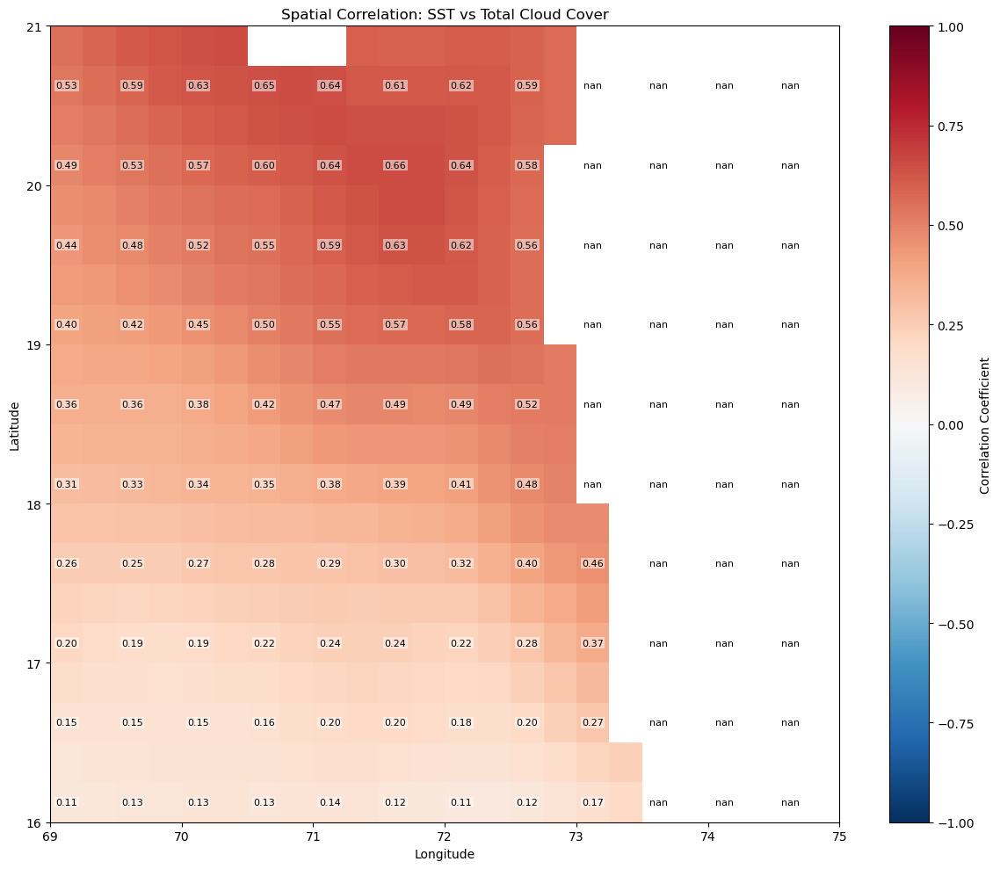

In [8]:
sst_data = xr.open_dataset(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
ecmwf_data = xr.open_dataset(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")

# Ensure same time period
sst = sst_data.sst.sel(time=slice('2019-01-01', '2024-12-01'))
tcc = ecmwf_data.tcc.sel(valid_time=slice('2019-01-01', '2024-12-01'))

# Interpolate to common grid
tcc_interp = tcc.interp(latitude=sst.lat, longitude=sst.lon)
tcc_interp = tcc_interp.rename({'valid_time': 'time'})

# Compute correlation at each grid point
correlation = xr.corr(sst, tcc_interp, dim='time')

# Plot
plt.figure(figsize=(12, 10))
im = plt.pcolormesh(sst.lon, sst.lat, correlation, cmap='RdBu_r', vmin=-1, vmax=1)
plt.colorbar(im, label='Correlation Coefficient')
plt.title('Spatial Correlation: SST vs Total Cloud Cover')

# Add correlation values as text on the plot
for i in range(len(sst.lat)):
    for j in range(len(sst.lon)):
        # Only show values at some grid points to avoid overcrowding
        if i % 2 == 0 and j % 2 == 0:  # Show every other point
            plt.text(sst.lon[j], sst.lat[i], 
                     f'{correlation.values[i, j]:.2f}',  # Format to 2 decimal places
                     ha='center', va='center', 
                     color='black', fontsize=8,
                     bbox=dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1))

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.savefig('sst_tcc_correlation_with_values.png', dpi=300)
plt.show()

4 SST AND U10

C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. 

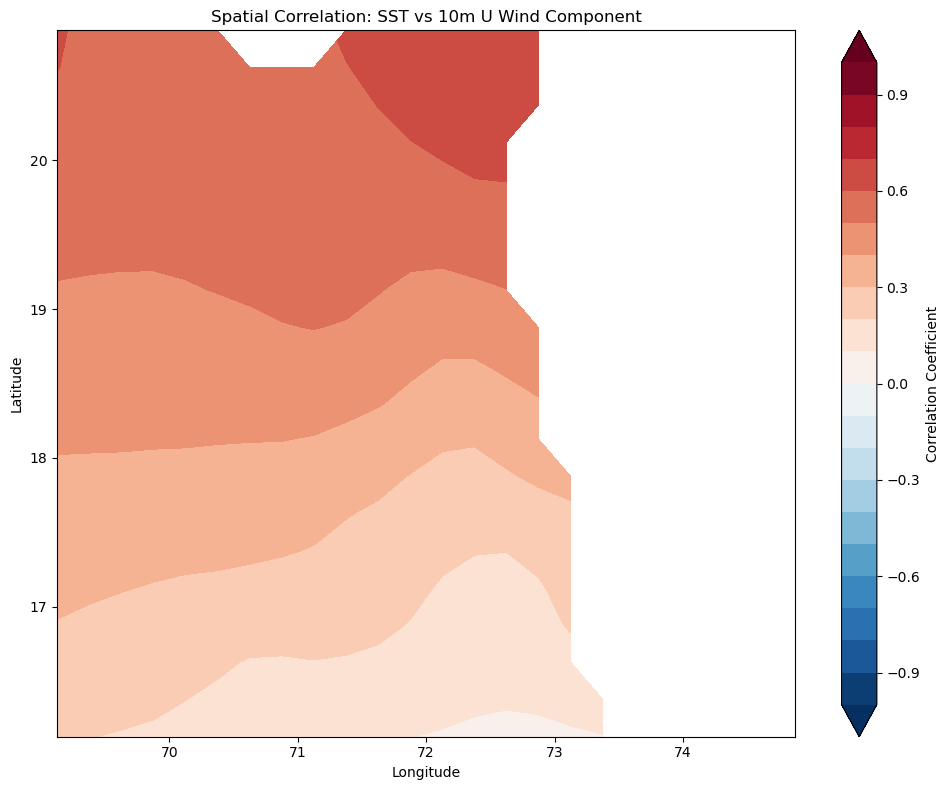

In [10]:
from matplotlib.colors import TwoSlopeNorm

sst_data = xr.open_dataset(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
ecmwf_data = xr.open_dataset(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")

# Ensure same time period
sst = sst_data.sst.sel(time=slice('2019-01-01', '2024-12-01'))
u10 = ecmwf_data.u10.sel(valid_time=slice('2019-01-01', '2024-12-01'))

# Align time coordinates and interpolate to common grid
u10_interp = u10.interp(latitude=sst.lat, longitude=sst.lon)
u10_interp = u10_interp.rename({'valid_time': 'time'})

# Compute correlation at each grid point
correlation = xr.corr(sst, u10_interp, dim='time')

# Plot with custom colormap
fig, ax = plt.subplots(figsize=(10, 8))
norm = TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
im = ax.contourf(sst.lon, sst.lat, correlation, 
               levels=np.linspace(-1, 1, 21),
               cmap='RdBu_r', norm=norm, extend='both')
plt.colorbar(im, label='Correlation Coefficient')
plt.title('Spatial Correlation: SST vs 10m U Wind Component')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.savefig('sst_u10_correlation.png', dpi=300)
plt.show()

5. SST - V10

In [11]:
import cmocean

sst_data = xr.open_dataset(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
ecmwf_data = xr.open_dataset(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")

# Ensure same time period 
sst = sst_data.sst.sel(time=slice('2019-01-01', '2024-12-01'))
v10 = ecmwf_data.v10.sel(valid_time=slice('2019-01-01', '2024-12-01'))

# Interpolate to common grid
v10_interp = v10.interp(latitude=sst.lat, longitude=sst.lon)
v10_interp = v10_interp.rename({'valid_time': 'time'})

# Compute correlation at each grid point
correlation = xr.corr(sst, v10_interp, dim='time')

# Plot with cmocean colormap
plt.figure(figsize=(11, 8))
im = plt.pcolormesh(sst.lon, sst.lat, correlation, 
                   cmap=cmocean.cm.balance, vmin=-1, vmax=1)
plt.colorbar(im, label='Correlation Coefficient')
plt.title('Spatial Correlation: SST vs 10m V Wind Component')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
#plt.savefig('sst_v10_correlation.png', dpi=300)
plt.show()


ModuleNotFoundError: No module named 'cmocean'

6. SST -MSL 

C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. 

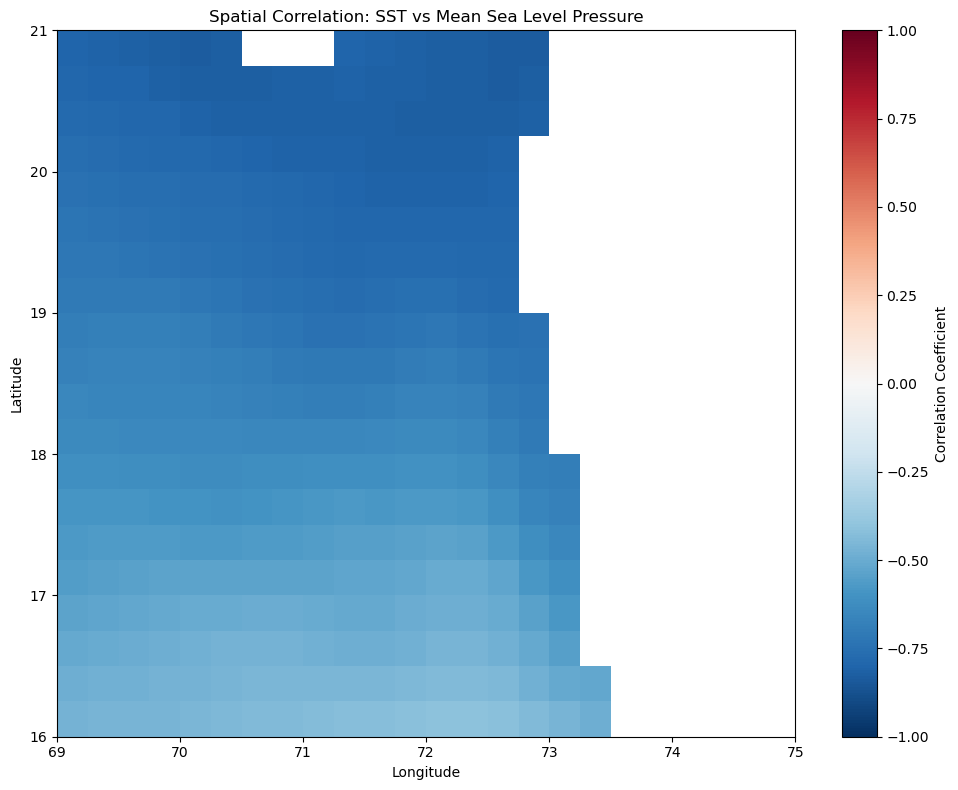

In [13]:
sst_data = xr.open_dataset(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
ecmwf_data = xr.open_dataset(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")

# Ensure same time period
sst = sst_data.sst.sel(time=slice('2019-01-01', '2024-12-01'))
msl = ecmwf_data.msl.sel(valid_time=slice('2019-01-01', '2024-12-01'))

# Interpolate ECMWF data to SST grid
msl_interp = msl.interp(latitude=sst.lat, longitude=sst.lon, method='linear')
# Rename dimensions for consistency
msl_interp = msl_interp.rename({'valid_time': 'time'})

# Compute correlation at each grid point
correlation = xr.corr(sst, msl_interp, dim='time')

# Plot
plt.figure(figsize=(10, 8))
im = plt.pcolormesh(sst.lon, sst.lat, correlation, cmap='RdBu_r', vmin=-1, vmax=1)
plt.colorbar(im, label='Correlation Coefficient')
plt.title('Spatial Correlation: SST vs Mean Sea Level Pressure')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.tight_layout()
plt.savefig(r'C:\Users\Admin\RIYA PROJECT\visualizations\combinations\corr\sst_msl_correlation.png', dpi=300)
plt.show()

# SCATTER PLOTS 

In [32]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats

# 1. SST vs Precipitation
def plot_sst_vs_precip():
    sst_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
    precip_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\precip_konkan.nc")
   
    # Resample to common grid
    sst = sst_ds.sst.resample(time='1M').mean()
    precip = precip_ds.precip.resample(time='1M').mean()
   
    # Interpolate to common grid
    sst_interp = sst.interp(lat=precip.lat, lon=precip.lon)
   
    # Flatten arrays for scatter plot
    sst_flat = sst_interp.values.flatten()
    precip_flat = precip.values.flatten()
   
    # Remove NaN values
    mask = ~np.isnan(sst_flat) & ~np.isnan(precip_flat)
    sst_clean = sst_flat[mask]
    precip_clean = precip_flat[mask]
   
    # Create scatter plot
    plt.figure(figsize=(8, 6))
    plt.scatter(sst_clean, precip_clean, alpha=0.5)
    plt.xlabel('Sea Surface Temperature (K)')
    plt.ylabel('Precipitation (mm/day)')
    plt.title('SST vs Precipitation')
   
    # Add trend line
    slope, intercept, r_value, p_value, std_err = stats.linregress(sst_clean, precip_clean)
    plt.plot(sst_clean, intercept + slope*sst_clean, 'r', label=f'R² = {r_value**2:.2f}')
    plt.legend()
   
    plt.tight_layout()
    #plt.savefig('sst_vs_precip.png', dpi=300)
    plt.show()

# 2. SST vs Mean Sea Level Pressure
def plot_sst_vs_msl():
    sst_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
    ecmwf_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")
      
    # Rename ECMWF time coordinate to match SST
    ecmwf_ds = ecmwf_ds.rename({'valid_time': 'time'})
   
    # Resample to common grid
    sst = sst_ds.sst.resample(time='1M').mean()
    msl = ecmwf_ds.msl.resample(time='1M').mean()
   
    # Interpolate SST to ECMWF grid
    sst_interp = sst.interp(lat=msl.latitude, lon=msl.longitude)
   
    # Flatten arrays for scatter plot
    sst_flat = sst_interp.values.flatten()
    msl_flat = msl.values.flatten()
   
    # Remove NaN values
    mask = ~np.isnan(sst_flat) & ~np.isnan(msl_flat)
    sst_clean = sst_flat[mask]
    msl_clean = msl_flat[mask] / 100  # Convert Pa to hPa
   
    # Create scatter plot with hexbin for density
    plt.figure(figsize=(8, 6))
    plt.hexbin(sst_clean, msl_clean, gridsize=30, cmap='plasma')
    plt.colorbar(label='Count')
    plt.xlabel('Sea Surface Temperature (K)')
    plt.ylabel('Mean Sea Level Pressure (hPa)')
    plt.title('SST vs Mean Sea Level Pressure')
   
    plt.tight_layout()
    #plt.savefig('sst_vs_msl.png', dpi=300)
    plt.show()

# 3. SST vs Total Cloud Cover
def plot_sst_vs_tcc():
    sst_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
    ecmwf_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")
     
    # Rename ECMWF time coordinate to match SST
    ecmwf_ds = ecmwf_ds.rename({'valid_time': 'time'})
   
    # Resample to common temporal resolution
    sst = sst_ds.sst.resample(time='1M').mean()
    tcc = ecmwf_ds.tcc.resample(time='1M').mean()
   
    # Interpolate SST to ECMWF grid
    sst_interp = sst.interp(lat=tcc.latitude, lon=tcc.longitude)
   
    # Flatten arrays for scatter plot
    sst_flat = sst_interp.values.flatten()
    tcc_flat = tcc.values.flatten() * 100  # Convert fraction to percentage
   
    # Remove NaN values
    mask = ~np.isnan(sst_flat) & ~np.isnan(tcc_flat)
    sst_clean = sst_flat[mask]
    tcc_clean = tcc_flat[mask]
   
    # Create scatter plot with KDE
    plt.figure(figsize=(8, 6))
   
    # Create a colormap based on density
    xy = np.vstack([sst_clean, tcc_clean])
    z = stats.gaussian_kde(xy)(xy)
   
    plt.scatter(sst_clean, tcc_clean, c=z, s=30, alpha=0.6, cmap='plasma')
    plt.colorbar(label='Density')
   
    plt.xlabel('Sea Surface Temperature (K)')
    plt.ylabel('Total Cloud Cover (%)')
    plt.title('SST vs Total Cloud Cover')
   
    plt.tight_layout()
    #plt.savefig('sst_vs_tcc.png', dpi=300)
    plt.show()

# 4. SST vs Wind (U10)
def plot_sst_vs_u10():
    sst_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
    ecmwf_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")
   
    # Rename ECMWF time coordinate to match SST
    ecmwf_ds = ecmwf_ds.rename({'valid_time': 'time'})
   
    # Resample to common grid
    sst = sst_ds.sst.resample(time='1M').mean()
    u10 = ecmwf_ds.u10.resample(time='1M').mean()
   
    # Interpolate SST to ECMWF grid
    sst_interp = sst.interp(lat=u10.latitude, lon=u10.longitude)
   
    # Flatten arrays for scatter plot
    sst_flat = sst_interp.values.flatten()
    u10_flat = u10.values.flatten()
   
    # Remove NaN values
    mask = ~np.isnan(sst_flat) & ~np.isnan(u10_flat)
    sst_clean = sst_flat[mask]
    u10_clean = u10_flat[mask]
   
    # Create scatter plot with regression line
    plt.figure(figsize=(8, 6))
    plt.scatter(sst_clean, u10_clean, alpha=0.5, s=15, c='blue')
   
    # Add best fit polynomial
    z = np.polyfit(sst_clean, u10_clean, 2)
    p = np.poly1d(z)
   
    # Sort x values for smooth line
    x_sorted = np.sort(sst_clean)
    plt.plot(x_sorted, p(x_sorted), 'r--', linewidth=2)
   
    plt.xlabel('Sea Surface Temperature (K)')
    plt.ylabel('U Wind Component at 10m (m/s)')
    plt.title('SST vs U Wind Component')
   
    plt.tight_layout()
    #plt.savefig('sst_vs_u10.png', dpi=300)
    plt.show()

# 5. SST vs Wind (V10)
def plot_sst_vs_v10():
    sst_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
    ecmwf_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")
   
    # Rename ECMWF time coordinate to match SST
    ecmwf_ds = ecmwf_ds.rename({'valid_time': 'time'})
   
    # Resample to common grid
    sst = sst_ds.sst.resample(time='1M').mean()
    v10 = ecmwf_ds.v10.resample(time='1M').mean()
   
    # Interpolate SST to ECMWF grid
    sst_interp = sst.interp(lat=v10.latitude, lon=v10.longitude)
   
    # Flatten arrays for scatter plot
    sst_flat = sst_interp.values.flatten()
    v10_flat = v10.values.flatten()
   
    # Remove NaN values
    mask = ~np.isnan(sst_flat) & ~np.isnan(v10_flat)
    sst_clean = sst_flat[mask]
    v10_clean = v10_flat[mask]
   
    # Create bubble plot (size based on absolute wind speed)
    sizes = np.abs(v10_clean) * 5  # Scale for visualization
   
    plt.figure(figsize=(8, 6))
    plt.scatter(sst_clean, v10_clean, s=sizes, alpha=0.5,
                c=v10_clean, cmap='coolwarm', edgecolor='k', linewidth=0.3)
   
    cbar = plt.colorbar()
    cbar.set_label('V Wind Component (m/s)')
   
    plt.xlabel('Sea Surface Temperature (K)')
    plt.ylabel('V Wind Component at 10m (m/s)')
    plt.title('SST vs V Wind Component')
   
    plt.tight_layout()
    #plt.savefig('sst_vs_v10.png', dpi=300)
    plt.show()

# 6. SST vs Temperature at 2m
def plot_sst_vs_t2m():

    sst_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
    ecmwf_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")
   
    # Rename ECMWF time coordinate to match SST
    ecmwf_ds = ecmwf_ds.rename({'valid_time': 'time'})
   
    # Resample to common temporal resolution
    sst = sst_ds.sst.resample(time='1M').mean()
    t2m = ecmwf_ds.t2m.resample(time='1M').mean()
   
    # Interpolate SST to ECMWF grid
    sst_interp = sst.interp(lat=t2m.latitude, lon=t2m.longitude)
   
    # Flatten arrays for scatter plot
    sst_flat = sst_interp.values.flatten()
    t2m_flat = t2m.values.flatten()
   
    # Remove NaN values
    mask = ~np.isnan(sst_flat) & ~np.isnan(t2m_flat)
    sst_clean = sst_flat[mask]
    t2m_clean = t2m_flat[mask] - 273.15  # Convert K to °C
   
    # Create scatter plot with 2D histogram
    plt.figure(figsize=(8, 6))
   
    # Create 2D histogram
    h = plt.hist2d(sst_clean, t2m_clean, bins=30, cmap='YlOrRd')
    plt.colorbar(h[3], label='Count')
   
    # Add 1:1 line
    min_val = min(sst_clean.min(), t2m_clean.min())
    max_val = max(sst_clean.max(), t2m_clean.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5)
   
    plt.xlabel('Sea Surface Temperature (K)')
    plt.ylabel('Temperature at 2m (°C)')
    plt.title('SST vs 2m Air Temperature')
   
    plt.tight_layout()
    #plt.savefig('sst_vs_t2m.png', dpi=300)
    plt.show()


In [33]:
plot_sst_vs_precip()

C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. 

ValueError: operands could not be broadcast together with shapes (648,) (657,) 

C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. 

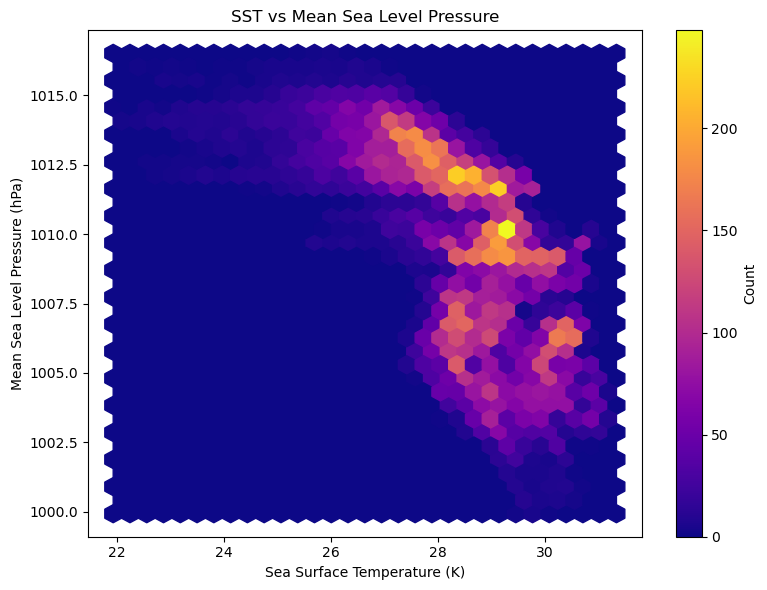

In [34]:
plot_sst_vs_msl()

C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. 

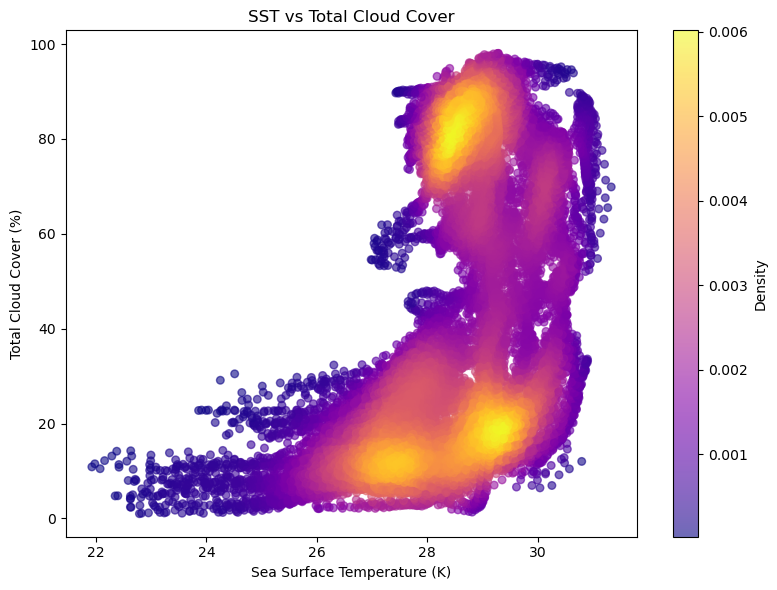

In [35]:
plot_sst_vs_tcc()

C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. 

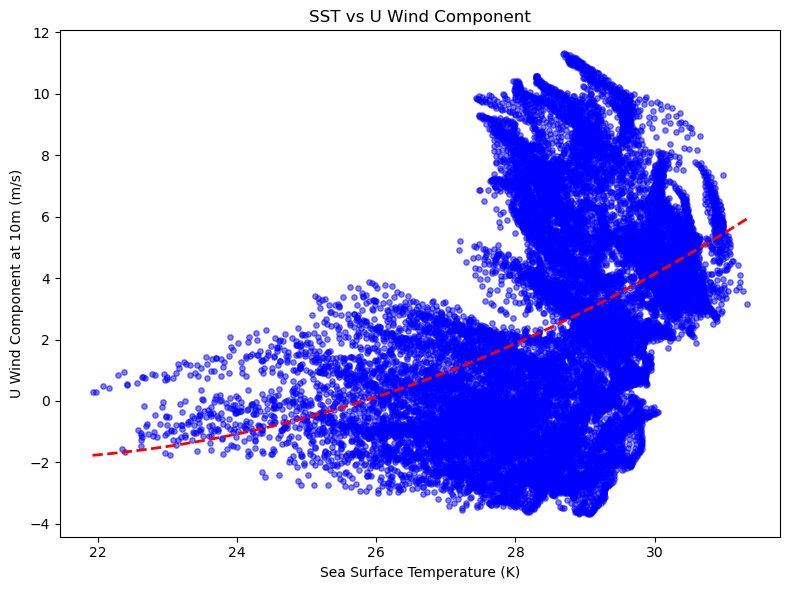

In [36]:
plot_sst_vs_u10()

C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. 

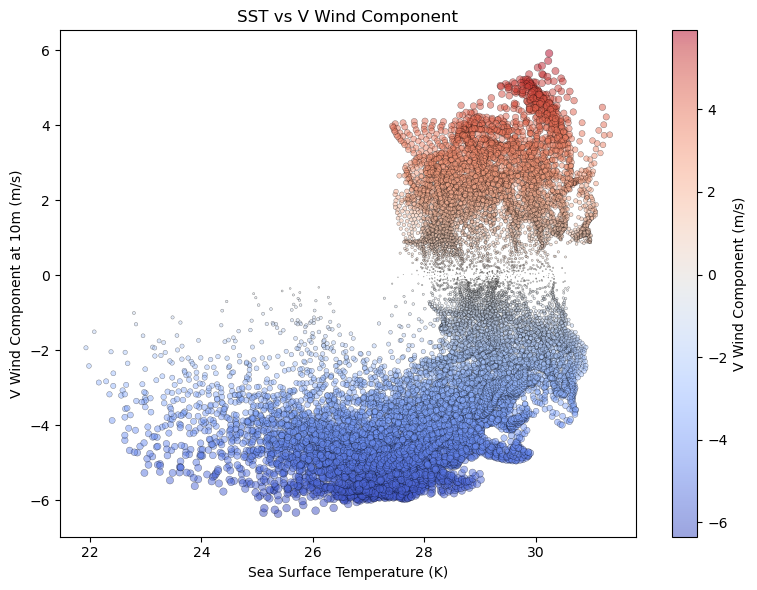

In [37]:
plot_sst_vs_v10()

C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
C:\ProgramData\Anaconda3\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. 

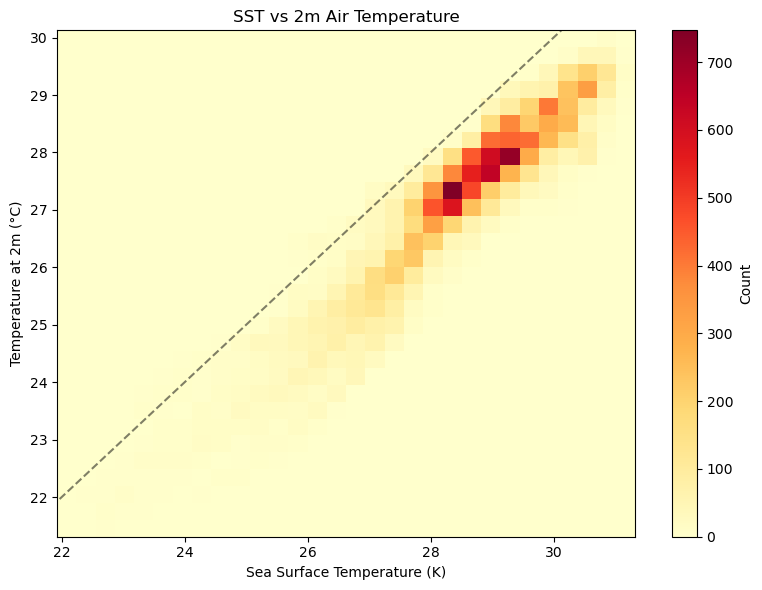

In [38]:
plot_sst_vs_t2m()

In [ ]:
precip_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\precip_konkan.nc")
sst_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
ecmwf_ds = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")

# MULTI WEATHER PANELS

In [39]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as colors
from matplotlib.gridspec import GridSpec

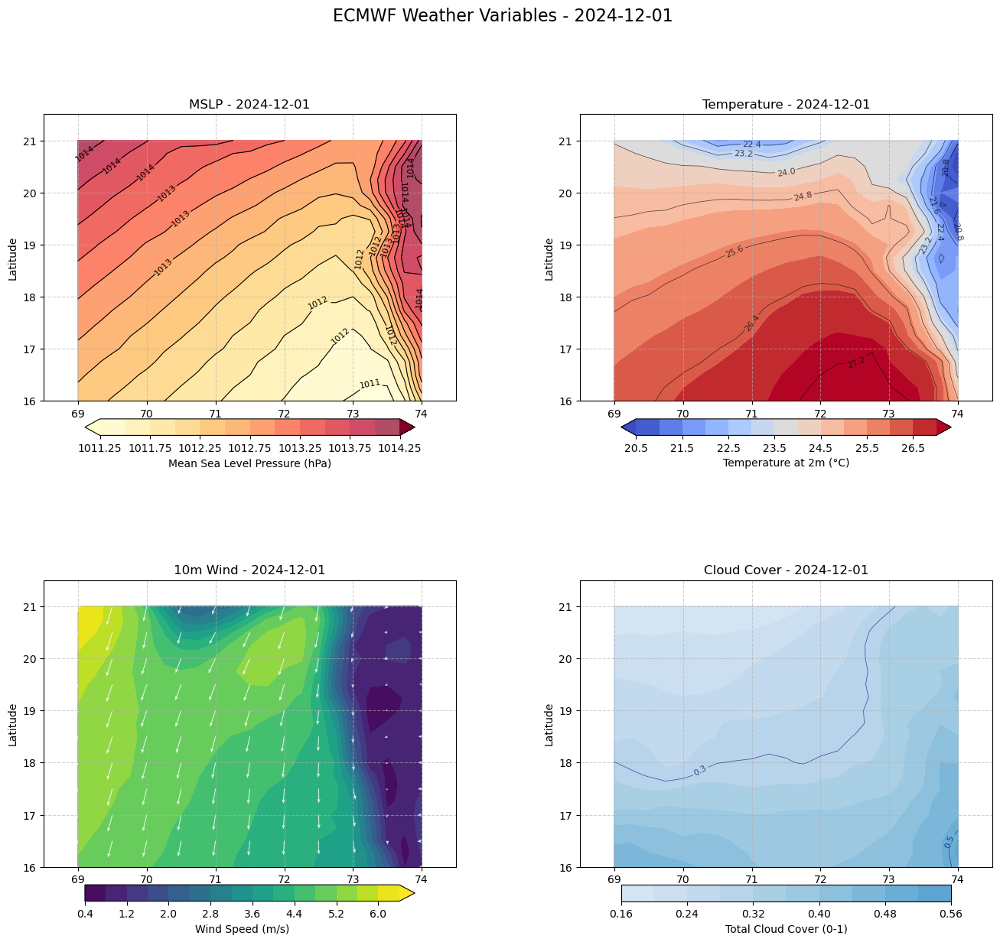

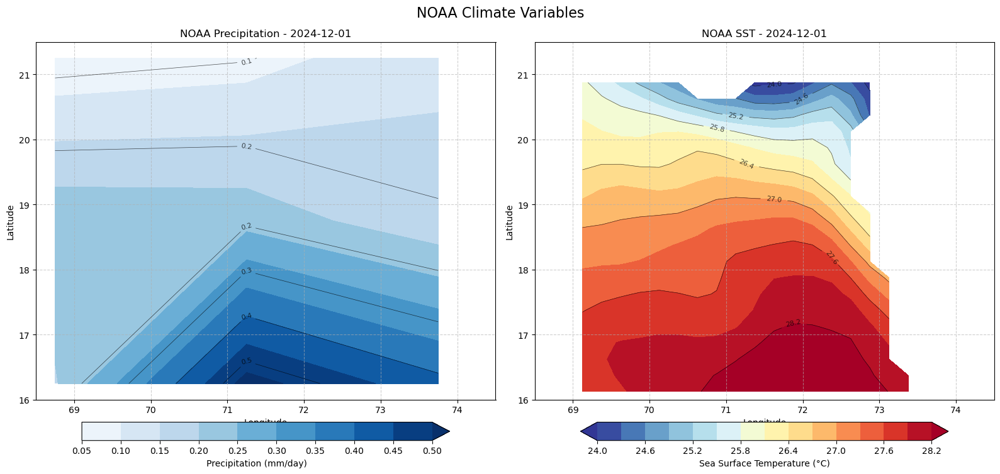

In [42]:
# Function to create combined multi-panel plots with all ECMWF variables
def plot_ecmwf_combined(ecmwf_file, output_file='ecmwf_combined.png'):
    ds = xr.open_dataset(ecmwf_file)
   
    # Create figure with 2x2 grid
    fig = plt.figure(figsize=(16, 14))
    gs = GridSpec(2, 2, figure=fig, wspace=0.3, hspace=0.3)
   
    # Select latest time for demonstration
    latest_time = ds.valid_time[-1].values
    date_str = np.datetime_as_string(latest_time, unit="D")
   
    # Common extent for all plots
    extent = [68.5, 74.5, 16.0, 21.5]
   
    # --- MSL Pressure Plot ---
    ax1 = fig.add_subplot(gs[0, 0])
    msl_hPa = ds.msl.sel(valid_time=latest_time) / 100  # Convert to hPa
   
    # Create contour lines
    cs1 = ax1.contour(
        ds.longitude, ds.latitude, msl_hPa,
        colors='black',
        levels=15,
        linewidths=0.8
    )
    plt.clabel(cs1, inline=True, fontsize=8, fmt='%1.0f')
   
    # Create filled contours
    cf1 = ax1.contourf(
        ds.longitude, ds.latitude, msl_hPa,
        cmap='YlOrRd',
        levels=15,
        alpha=0.7,
        extend='both'
    )
   
    cbar1 = plt.colorbar(cf1, ax=ax1, orientation='horizontal', pad=0.05, shrink=0.8)
    cbar1.set_label('Mean Sea Level Pressure (hPa)')
   
    ax1.grid(linestyle='--', alpha=0.6)
    ax1.set_xlim(extent[0], extent[1])
    ax1.set_ylim(extent[2], extent[3])
    ax1.set_xlabel('Longitude')
    ax1.set_ylabel('Latitude')
    ax1.set_title(f'MSLP - {date_str}')
   
    # --- Temperature Plot ---
    ax2 = fig.add_subplot(gs[0, 1])
    temp_celsius = ds.t2m.sel(valid_time=latest_time) - 273.15  # Convert to Celsius
   
    # Create filled contours
    cf2 = ax2.contourf(
        ds.longitude, ds.latitude, temp_celsius,
        cmap='coolwarm',
        levels=15,
        extend='both'
    )
   
    # Add contour lines
    cs2 = ax2.contour(
        ds.longitude, ds.latitude, temp_celsius,
        colors='black',
        levels=10,
        linewidths=0.5,
        alpha=0.7
    )
    plt.clabel(cs2, inline=True, fontsize=8, fmt='%1.1f')
   
    cbar2 = plt.colorbar(cf2, ax=ax2, orientation='horizontal', pad=0.05, shrink=0.8)
    cbar2.set_label('Temperature at 2m (°C)')
   
    ax2.grid(linestyle='--', alpha=0.6)
    ax2.set_xlim(extent[0], extent[1])
    ax2.set_ylim(extent[2], extent[3])
    ax2.set_xlabel('Longitude')
    ax2.set_ylabel('Latitude')
    ax2.set_title(f'Temperature - {date_str}')
   
    # --- Wind Plot ---
    ax3 = fig.add_subplot(gs[1, 0])
    u = ds.u10.sel(valid_time=latest_time)
    v = ds.v10.sel(valid_time=latest_time)
    wind_speed = np.sqrt(u**2 + v**2)
   
    # Create filled contours
    cf3 = ax3.contourf(
        ds.longitude, ds.latitude, wind_speed,
        cmap='viridis',
        levels=15,
        extend='max'
    )
   
    # Add wind barbs/vectors
    x = ds.longitude.values[::2]
    y = ds.latitude.values[::2]
    ax3.quiver(
        x, y,
        u.values[::2, ::2], v.values[::2, ::2],
        scale=120, width=0.002, headwidth=4, alpha=0.8, color='white'
    )
   
    cbar3 = plt.colorbar(cf3, ax=ax3, orientation='horizontal', pad=0.05, shrink=0.8)
    cbar3.set_label('Wind Speed (m/s)')
   
    ax3.grid(linestyle='--', alpha=0.6)
    ax3.set_xlim(extent[0], extent[1])
    ax3.set_ylim(extent[2], extent[3])
    ax3.set_xlabel('Longitude')
    ax3.set_ylabel('Latitude')
    ax3.set_title(f'10m Wind - {date_str}')
   
    # --- Total Cloud Cover Plot ---
    ax4 = fig.add_subplot(gs[1, 1])
   
    # Create custom colormap for clouds
    norm = colors.Normalize(vmin=0, vmax=1)
    cf4 = ax4.contourf(
        ds.longitude, ds.latitude, ds.tcc.sel(valid_time=latest_time),
        cmap='Blues',
        norm=norm,
        levels=10,
        extend='neither'
    )
   
    # Add contour lines
    cs4 = ax4.contour(
        ds.longitude, ds.latitude, ds.tcc.sel(valid_time=latest_time),
        colors='navy',
        levels=[0.1, 0.3, 0.5, 0.7, 0.9],
        linewidths=0.5,
        alpha=0.7
    )
    plt.clabel(cs4, inline=True, fontsize=8, fmt='%.1f')
   
    cbar4 = plt.colorbar(cf4, ax=ax4, orientation='horizontal', pad=0.05, shrink=0.8)
    cbar4.set_label('Total Cloud Cover (0-1)')
   
    ax4.grid(linestyle='--', alpha=0.6)
    ax4.set_xlim(extent[0], extent[1])
    ax4.set_ylim(extent[2], extent[3])
    ax4.set_xlabel('Longitude')
    ax4.set_ylabel('Latitude')
    ax4.set_title(f'Cloud Cover - {date_str}')
   
    # Main title
    plt.suptitle(f'ECMWF Weather Variables - {date_str}', fontsize=16, y=0.98)
   
    #plt.savefig(output_file, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# Function for a combined NOAA variables plot
def plot_noaa_combo(precip_file, sst_file, output_file='noaa_combo.png'):
    precip_ds = xr.open_dataset(precip_file)
    sst_ds = xr.open_dataset(sst_file)
   
    # Create figure with 1x2 grid
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
   
    # Find common time step (latest available in both datasets)
    precip_times = precip_ds.time.values
    sst_times = sst_ds.time.values
   
    # Find common times and select the latest
    common_times = [t for t in precip_times if t in sst_times]
    if not common_times:
        latest_time_precip = precip_times[-1]
        latest_time_sst = sst_times[-1]
        date_str_precip = np.datetime_as_string(latest_time_precip, unit="D")
        date_str_sst = np.datetime_as_string(latest_time_sst, unit="D")
    else:
        latest_time = max(common_times)
        latest_time_precip = latest_time_sst = latest_time
        date_str_precip = date_str_sst = np.datetime_as_string(latest_time, unit="D")
   
    # Common extent
    extent = [68.5, 74.5, 16.0, 21.5]
   
    # --- Precipitation Plot ---
    precip_data = precip_ds.precip.sel(time=latest_time_precip)
   
    # Use log norm for better visualization of precipitation values
    vmin = max(0.1, precip_data.where(precip_data > 0).min().item())  # Avoid log(0)
    vmax = precip_data.max().item()
   
    # Use log norm if there's a wide range of values
    if vmax / vmin > 10:
        norm = colors.LogNorm(vmin=vmin, vmax=vmax)
    else:
        norm = None
   
    cf1 = ax1.contourf(
        precip_ds.lon, precip_ds.lat, precip_data,
        cmap='Blues',
        norm=norm,
        levels=10,
        extend='max'
    )
   
    # Add contour lines
    cs1 = ax1.contour(
        precip_ds.lon, precip_ds.lat, precip_data,
        colors='black',
        levels=5,
        linewidths=0.5,
        alpha=0.7
    )
    plt.clabel(cs1, inline=True, fontsize=8, fmt='%.1f')
   
    cbar1 = plt.colorbar(cf1, ax=ax1, orientation='horizontal', pad=0.05, shrink=0.8)
    cbar1.set_label('Precipitation (mm/day)')
   
    ax1.grid(linestyle='--', alpha=0.6)
    ax1.set_xlim(extent[0], extent[1])
    ax1.set_ylim(extent[2], extent[3])
    ax1.set_xlabel('Longitude')
    ax1.set_ylabel('Latitude')
    ax1.set_title(f'NOAA Precipitation - {date_str_precip}')
   
    # --- SST Plot ---
    sst_data = sst_ds.sst.sel(time=latest_time_sst)
   
    cf2 = ax2.contourf(
        sst_ds.lon, sst_ds.lat, sst_data,
        cmap='RdYlBu_r',
        levels=15,
        extend='both'
    )
   
    # Add contour lines
    cs2 = ax2.contour(
        sst_ds.lon, sst_ds.lat, sst_data,
        colors='black',
        levels=8,
        linewidths=0.5,
        alpha=0.7
    )
    plt.clabel(cs2, inline=True, fontsize=8, fmt='%.1f')
   
    cbar2 = plt.colorbar(cf2, ax=ax2, orientation='horizontal', pad=0.05, shrink=0.8)
    cbar2.set_label('Sea Surface Temperature (°C)')
   
    ax2.grid(linestyle='--', alpha=0.6)
    ax2.set_xlim(extent[0], extent[1])
    ax2.set_ylim(extent[2], extent[3])
    ax2.set_xlabel('Longitude')
    ax2.set_ylabel('Latitude')
    ax2.set_title(f'NOAA SST - {date_str_sst}')
   
    # Main title
    plt.suptitle('NOAA Climate Variables', fontsize=16, y=0.98)
   
    plt.tight_layout()
    plt.show()
    #plt.savefig(output_file, dpi=300, bbox_inches='tight')
    plt.close()


plot_ecmwf_combined(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")
plot_noaa_combo(r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\precip_konkan.nc", r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")

# INTERACTIVE PLOTS WITH HOLOVIEWS

Wont run because no internet- more useful if more years data 

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
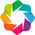

In [6]:
import xarray as xr
import numpy as np
import pandas as pd
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

In [9]:
# noaa_precip = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\precip_konkan.nc")
# noaa_sst = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\noaa_sst_masked.nc")
# ecmwf = xr.open_dataset( r"C:\Users\Admin\RIYA PROJECT\DATASETS\main datasets to use\ECMWF - skt , v10 ,u10 , msl ,tcc , 2m temp.nc")

# # Extract common time period and ensure consistent time axis
# def align_datasets():
#     # Convert all times to pandas datetime
#     noaa_precip['time'] = pd.to_datetime(noaa_precip.time.values)
#     noaa_sst['time'] = pd.to_datetime(noaa_sst.time.values)
#     ecmwf['valid_time'] = pd.to_datetime(ecmwf.valid_time.values)
   
#     # Find common date range
#     start_date = max(
#         noaa_precip.time.values.min(),
#         noaa_sst.time.values.min(),
#         ecmwf.valid_time.values.min()
#     )
   
#     end_date = min(
#         noaa_precip.time.values.max(),
#         noaa_sst.time.values.max(),
#         ecmwf.valid_time.values.max()
#     )
   
#     # Slice datasets to common time period
#     noaa_precip_subset = noaa_precip.sel(time=slice(start_date, end_date))
#     noaa_sst_subset = noaa_sst.sel(time=slice(start_date, end_date))
#     ecmwf_subset = ecmwf.sel(valid_time=slice(start_date, end_date))
   
#     return noaa_precip_subset, noaa_sst_subset, ecmwf_subset

# noaa_precip_aligned, noaa_sst_aligned, ecmwf_aligned = align_datasets()

# # Calculate spatial means
# precip_mean = noaa_precip_aligned.precip.mean(dim=['lat', 'lon'])
# sst_mean = noaa_sst_aligned.sst.mean(dim=['lat', 'lon'])

# # Create DataFrames for plotting
# precip_df = pd.DataFrame({
#     'time': noaa_precip_aligned.time.values,
#     'precip': precip_mean.values
# })

# sst_df = pd.DataFrame({
#     'time': noaa_sst_aligned.time.values,
#     'sst': sst_mean.values
# })

# ecmwf_df = pd.DataFrame({
#     'time': ecmwf_aligned.valid_time.values,
#     'msl': ecmwf_aligned.msl.mean(dim=['latitude', 'longitude']).values,
#     'tcc': ecmwf_aligned.tcc.mean(dim=['latitude', 'longitude']).values,
#     't2m': ecmwf_aligned.t2m.mean(dim=['latitude', 'longitude']).values,
#     'u10': ecmwf_aligned.u10.mean(dim=['latitude', 'longitude']).values,
#     'v10': ecmwf_aligned.v10.mean(dim=['latitude', 'longitude']).values
# })

# # Create interactive plot function
# def create_interactive_comparison(df1, var1, df2, var2, title=None):
#     # Create curves
#     curve1 = hv.Curve(df1, 'time', var1, label=var1)
#     curve2 = hv.Curve(df2, 'time', var2, label=var2)
   
#     # Apply styling
#     curve1 = curve1.opts(
#         color='blue',
#         line_width=2,
#         title=title if title else f"{var1} vs {var2}"
#     )
   
#     curve2 = curve2.opts(
#         color='red',
#         line_width=2,
#         ylabel=var2
#     )
   
#     # Create overlay
#     overlay = (curve1 * curve2).opts(
#         opts.Curve(tools=['hover']),
#         opts.Overlay(legend_position='top_left')
#     )
   
#     return overlay

# # Generate all requested comparison plots
# plots = {}

# # Merge dataframes on time
# merged_precip_sst = pd.merge(precip_df, sst_df, on='time', how='inner')
# merged_ecmwf_sst = pd.merge(ecmwf_df, sst_df, on='time', how='inner')

# # 1. Precip and SST
# plots['precip_sst'] = create_interactive_comparison(
#     merged_precip_sst, 'precip',
#     merged_precip_sst, 'sst',
#     'Precipitation vs SST Time Series'
# )

# # 2. SST and t2m
# plots['sst_t2m'] = create_interactive_comparison(
#     merged_ecmwf_sst, 'sst',
#     merged_ecmwf_sst, 't2m',
#     'SST vs 2m Temperature Time Series'
# )

# # 3. SST and tcc
# plots['sst_tcc'] = create_interactive_comparison(
#     merged_ecmwf_sst, 'sst',
#     merged_ecmwf_sst, 'tcc',
#     'SST vs Total Cloud Cover Time Series'
# )

# # 4. SST and msl
# plots['sst_msl'] = create_interactive_comparison(
#     merged_ecmwf_sst, 'sst',
#     merged_ecmwf_sst, 'msl',
#     'SST vs Mean Sea Level Pressure Time Series'
# )

# # 5. SST and tcc (duplicate, skipping)

# # 6. SST and u10
# plots['sst_u10'] = create_interactive_comparison(
#     merged_ecmwf_sst, 'sst',
#     merged_ecmwf_sst, 'u10',
#     'SST vs 10m U-wind Component Time Series'
# )

# # 7. SST and v10
# plots['sst_v10'] = create_interactive_comparison(
#     merged_ecmwf_sst, 'sst',
#     merged_ecmwf_sst, 'v10',
#     'SST vs 10m V-wind Component Time Series'
# )

# # Save plots
# for name, plot in plots.items():
#     hv.save(plot, f'{name}_interactive.html')
   
#  # Display example layout (when running in a notebook)
# layout = hv.Layout(list(plots.values())).cols(2)
# layout.opts(
#     opts.Layout(title='Combined Time Series Analysis', sizing_mode='stretch_width')
# )